In [1]:
import sys
sys.path.append('../')
%load_ext autoreload
%autoreload 3

import xarray as xr
import matplotlib.pyplot as plt
from helpers.computational_tools import *
import xesmf as xe
import gsw

from helpers.compute_APE import compute_APE, compute_mask
from helpers.collection_of_experiments import CollectionOfExperiments

# Initialize OM4 data

In [4]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

In [89]:
T = (ds['unparameterized'].ocean_annual_z.thetao.sel(time=slice('2007')).mean('time')).compute().transpose('zl',...)
S = (ds['unparameterized'].ocean_annual_z.so.sel(time=slice('2007')).mean('time')).compute().transpose('zl',...)

In [90]:
T_ann = (ds['ANN'].ocean_annual_z.thetao.sel(time=slice('2007')).mean('time')).compute().transpose('zl',...)
S_ann = (ds['ANN'].ocean_annual_z.so.sel(time=slice('2007')).mean('time')).compute().transpose('zl',...)

In [48]:
param = ds['unparameterized'].param

In [91]:
dz = ds['unparameterized'].dz
zi = ds['unparameterized'].ocean_annual_z.zi

In [60]:
mask = compute_mask(T, param)

# CM2.6 data

In [43]:
cm26_salt = xr.open_dataset('cm26_salt.nc').salt
cm26_temp = xr.open_dataset('cm26_temp.nc').temp

In [79]:
ds = xr.open_dataset("gs://cmip6/GFDL_CM2_6/control/ocean", engine='zarr', chunks={}, use_cftime=True).rename(
                {'st_ocean': 'zl'})

In [93]:
param_cm26 = xr.open_dataset('gs://cmip6/GFDL_CM2_6/grid', engine='zarr').rename(
                {'st_ocean': 'zl'})

In [98]:
from dask.diagnostics import ProgressBar
# Year-average
with ProgressBar():
    cm26_salt = ds.salt[-12:].mean('time').compute()

[########################################] | 100% Completed | 26.64 s


In [99]:
cm26_salt.to_netcdf('cm26_salt.nc')

In [100]:
with ProgressBar():
    cm26_temp = ds.temp[-12:].mean('time').compute()

[########################################] | 100% Completed | 29.32 s


In [101]:
cm26_temp.to_netcdf('cm26_temp.nc')

# Interpolate cm26 data to OM4 grid

In [102]:
coords = xr.Dataset()
coords['lon'] = param_cm26.geolon_e.interp(xu_ocean=param_cm26.xt_ocean)
coords['lat'] = param_cm26.geolat_n.interp(yu_ocean=param_cm26.yt_ocean)

coords_out = xr.Dataset()
coords_out['lon'] = param.geolon
coords_out['lat'] = param.geolat

regridder_cm26_om4 = xe.Regridder(coords, coords_out, "nearest_s2d", periodic=True)

In [103]:
cm26_S = cm26_salt.interp(zl = T.zl)
cm26_S[0] = cm26_salt[0].copy() # Restore surface value
cm26_S = regridder_cm26_om4(cm26_S)

In [104]:
cm26_T = cm26_temp.interp(zl = T.zl)
cm26_T[0] = cm26_temp[0].copy() # Restore surface value
cm26_T = regridder_cm26_om4(cm26_T)

# CM 2.5 data and interpolation to OM4 grid

In [52]:
salt_cm25 = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean.nc').salt.mean('time').compute()
temp_cm25 = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean.nc').temp.mean('time').compute()

In [53]:
# Interpolate to OM4 grid

coords = xr.Dataset()
coords['lon'] = salt_cm25.geolon_t
coords['lat'] = salt_cm25.geolat_t

coords_out = xr.Dataset()
coords_out['lon'] = param.geolon
coords_out['lat'] = param.geolat

regridder_cm25_om4 = xe.Regridder(coords, coords_out, "nearest_s2d", periodic=True)

In [54]:
cm25_S = salt_cm25.interp(st_ocean = T.zl)
cm25_S[0] = salt_cm25[0].copy()
cm25_S = regridder_cm25_om4(cm25_S)

In [55]:
cm25_T = temp_cm25.interp(st_ocean = T.zl)
cm25_T[0] = temp_cm25[0].copy()
cm25_T = regridder_cm25_om4(cm25_T)

# Compute APE for three experiments. Keep same NaNs mask

In [62]:
om4_nan = xr.where(np.isnan(T), np.nan, 1)
cm26_nan = xr.where(np.isnan(cm26_T), np.nan, 1)
cm25_nan = xr.where(np.isnan(cm25_T), np.nan, 1)

common_mask = om4_nan * cm26_nan * cm25_nan * mask

In [64]:
common_mask.to_netcdf('common_mask.nc')

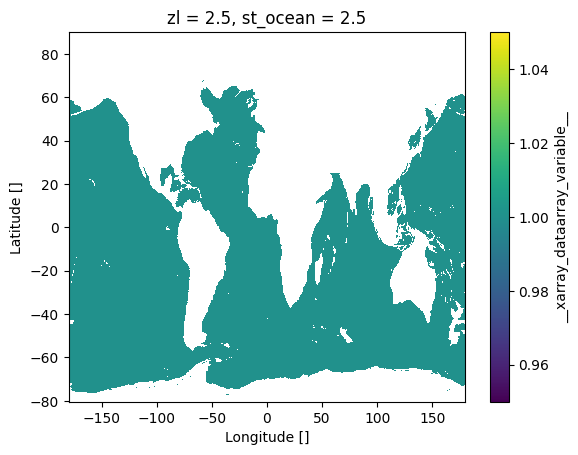

In [156]:
common_mask.isel(zl=0).plot()

In [66]:
# Necessary to remove lower layers where there are no computational grid points
(cm26_T*common_mask).sum(['xh','yh'])[:-3]

<xarray.DataArray (zl: 32)> Size: 256B
array([9209070.08637885, 9193408.20077432, 9136632.65568831,
       8949690.45709828, 8445684.15786417, 7841394.45143441,
       7400265.36346139, 7049621.74174456, 6662175.08446764,
       6226055.06058562, 5833726.25721642, 5426765.69873652,
       4950274.63007409, 4455688.53615599, 3981074.44843572,
       3552244.26224836, 3176771.40168341, 2849515.40749916,
       2559298.00430997, 2359077.69842052, 2168421.70385559,
       2023904.81734619, 1889009.78148285, 1728455.32744322,
       1534712.62196501, 1318180.19186773, 1054287.30605604,
        840005.02261818,  650751.30440238,  418515.49603992,
        272126.22789123,  107929.89139534])
Coordinates:
  * zl        (zl) float64 256B 2.5 10.0 20.0 32.5 ... 4e+03 4.5e+03 5e+03
    st_ocean  (zl) float64 256B 2.5 10.0 20.0 32.5 ... 4e+03 4.5e+03 5e+03

In [110]:
# In new data workflow, we estimate APE from year-averaged TnS

In [106]:
%time APE_om4 = compute_APE((T*common_mask)[:-3], (S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 16s, sys: 2 s, total: 2min 18s
Wall time: 2min 18s


In [107]:
%time APE_ann = compute_APE((T_ann*common_mask)[:-3], (S_ann*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 13s, sys: 1.99 s, total: 2min 15s
Wall time: 2min 16s


In [108]:
%time APE_cm26 = compute_APE((cm26_T*common_mask)[:-3], (cm26_S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 13s, sys: 2 s, total: 2min 15s
Wall time: 2min 15s


In [109]:
%time APE_cm25 = compute_APE((cm25_T*common_mask)[:-3], (cm25_S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 14s, sys: 2.04 s, total: 2min 16s
Wall time: 2min 17s


In [111]:
APE_cm26['APE_total']

<xarray.DataArray ()> Size: 8B
array(3.85075241e+20)

In [112]:
APE_cm25['APE_total']

<xarray.DataArray ()> Size: 8B
array(4.3310911e+20)

In [113]:
APE_om4['APE_total']

<xarray.DataArray ()> Size: 8B
array(3.45220639e+20)

In [114]:
APE_ann['APE_total']

<xarray.DataArray ()> Size: 8B
array(3.21712652e+20)

In [116]:
APE_om4['APE'].to_netcdf('APE_om4.nc')
APE_ann['APE'].to_netcdf('APE_ann.nc')
APE_cm26['APE'].to_netcdf('APE_cm26.nc')
APE_cm25['APE'].to_netcdf('APE_cm25.nc')

In [83]:
APE_om4 = xr.open_dataset('APE_om4.nc').__xarray_dataarray_variable__
APE_ann = xr.open_dataset('APE_ann.nc').__xarray_dataarray_variable__
APE_cm26 = xr.open_dataset('APE_cm26.nc').__xarray_dataarray_variable__
APE_cm25 = xr.open_dataset('APE_cm25.nc').__xarray_dataarray_variable__
common_mask = xr.open_dataset('common_mask.nc').__xarray_dataarray_variable__

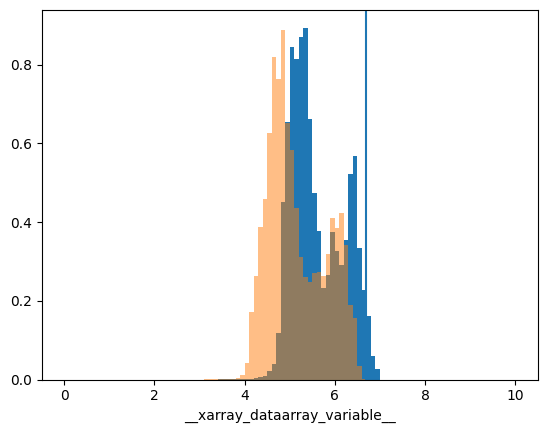

In [85]:
rho0=1035
np.log10(rho0*np.abs(APE_cm26-APE_cm25).sum('zi')).plot.hist(range=[0,10], bins=100, density=True);
np.log10(rho0*np.abs(APE_ann-APE_om4).sum('zi')).plot.hist(range=[0,10], bins=100, alpha=0.5, density=True);
plt.axvline(x=np.log10(5e+6))

In [142]:
import matplotlib as mpl
norm = mpl.colors.SymLogNorm(vmin = -5e+6, vmax = 5e+6, linthresh = 5e+5 )
cmap=cmocean.cm.balance
params = dict(norm=norm, cmap=mpl.cm.RdBu_r,rasterized=True, transform=ccrs.PlateCarree(), cbar_kwargs=dict(label='Depth-integrated \n$\Delta$APE [J/m$^2$]', shrink=0.36, extend='both'))

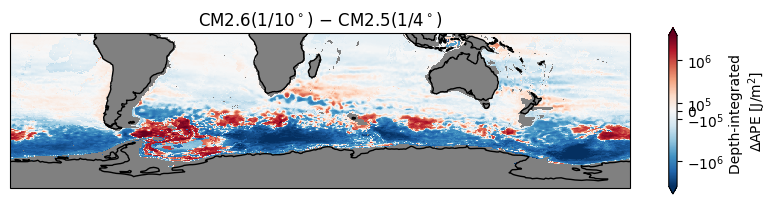

In [143]:
fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=50))
(rho0*(APE_cm26.sum('zi') - APE_cm25.sum('zi'))*common_mask[0]).plot.pcolormesh(ax=ax,**params)
ax.set_extent([-180,180,-90,0],ccrs.PlateCarree())
plt.title('CM2.6($1/10^\circ$) $-$ CM2.5($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dAPE_CM_suite_SO.pdf', dpi=200, bbox_inches='tight')

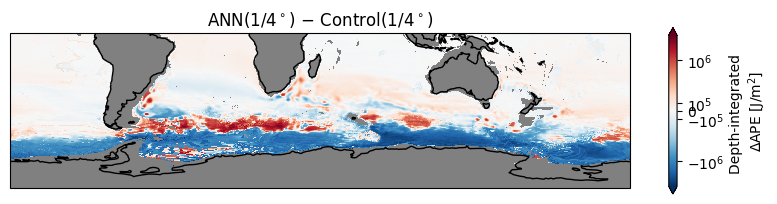

In [144]:
fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=50))
(rho0*(APE_ann.sum('zi') - APE_om4.sum('zi'))*common_mask[0]).plot.pcolormesh(ax=ax,**params)
ax.set_extent([-180,180,-90,0],ccrs.PlateCarree())
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dAPE_ANN_SO.pdf', dpi=200, bbox_inches='tight')

# Interfaces in Southern Ocean
For visualisation of interfaces, we use the same density (sigma2), the same mask, and the same interface values as those used to compute APE above

In [157]:
%time APE_om4 = compute_APE((T*common_mask)[:-3], (S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 17s, sys: 2.07 s, total: 2min 19s
Wall time: 2min 19s


In [158]:
%time APE_ann = compute_APE((T_ann*common_mask)[:-3], (S_ann*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 14s, sys: 2.14 s, total: 2min 16s
Wall time: 2min 17s


In [159]:
%time APE_cm26 = compute_APE((cm26_T*common_mask)[:-3], (cm26_S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 13s, sys: 2.11 s, total: 2min 15s
Wall time: 2min 15s


In [160]:
%time APE_cm25 = compute_APE((cm25_T*common_mask)[:-3], (cm25_S*common_mask)[:-3], param.areacello, dz[:-3], zi[:-3])

CPU times: user 2min 14s, sys: 2.12 s, total: 2min 16s
Wall time: 2min 17s


In [167]:
APE_om4['rho_sigma2'].to_netcdf('om4_rho_sigma2.nc')
APE_ann['rho_sigma2'].to_netcdf('ann_rho_sigma2.nc')
APE_cm26['rho_sigma2'].to_netcdf('cm26_rho_sigma2.nc')
APE_cm25['rho_sigma2'].to_netcdf('cm25_rho_sigma2.nc')

In [184]:
APE_om4['rho_sigma2_ref_edges']

<xarray.DataArray 'zi' (zi: 33)> Size: 264B
array([25.94507425, 30.26993434, 30.99152255, 31.60780742, 32.43174196,
       33.26910148, 33.86314166, 34.28500488, 34.58495961, 34.90381474,
       35.1853326 , 35.38507621, 35.59567605, 35.78741041, 35.95239112,
       36.08627775, 36.20607663, 36.29955059, 36.3814812 , 36.4562206 ,
       36.52248336, 36.58168294, 36.62741487, 36.68047639, 36.71435629,
       36.77115679, 36.83375025, 36.87797419, 36.91567861, 36.94409659,
       36.98251851, 37.0398561 , 37.64406607])
Coordinates:
  * zi       (zi) float64 264B 0.0 5.0 15.0 25.0 ... 4.25e+03 4.75e+03 5.25e+03
Attributes:
    long_name:       Depth at interface
    units:           meters
    cartesian_axis:  Z
    positive:        down

In [185]:
edges = [25.94507425, 30.26993434, 30.99152255, 31.60780742, 32.43174196,
       33.26910148, 33.86314166, 34.28500488, 34.58495961, 34.90381474,
       35.1853326 , 35.38507621, 35.59567605, 35.78741041, 35.95239112,
       36.08627775, 36.20607663, 36.29955059, 36.3814812 , 36.4562206 ,
       36.52248336, 36.58168294, 36.62741487, 36.68047639, 36.71435629,
       36.77115679, 36.83375025, 36.87797419, 36.91567861, 36.94409659,
       36.98251851, 37.0398561 , 37.64406607]

In [177]:
om4_rho_sigma2 = xr.open_dataset('om4_rho_sigma2.nc').__xarray_dataarray_variable__
ann_rho_sigma2 = xr.open_dataset('ann_rho_sigma2.nc').__xarray_dataarray_variable__
cm26_rho_sigma2 = xr.open_dataset('cm26_rho_sigma2.nc').__xarray_dataarray_variable__
cm25_rho_sigma2 = xr.open_dataset('cm25_rho_sigma2.nc').__xarray_dataarray_variable__

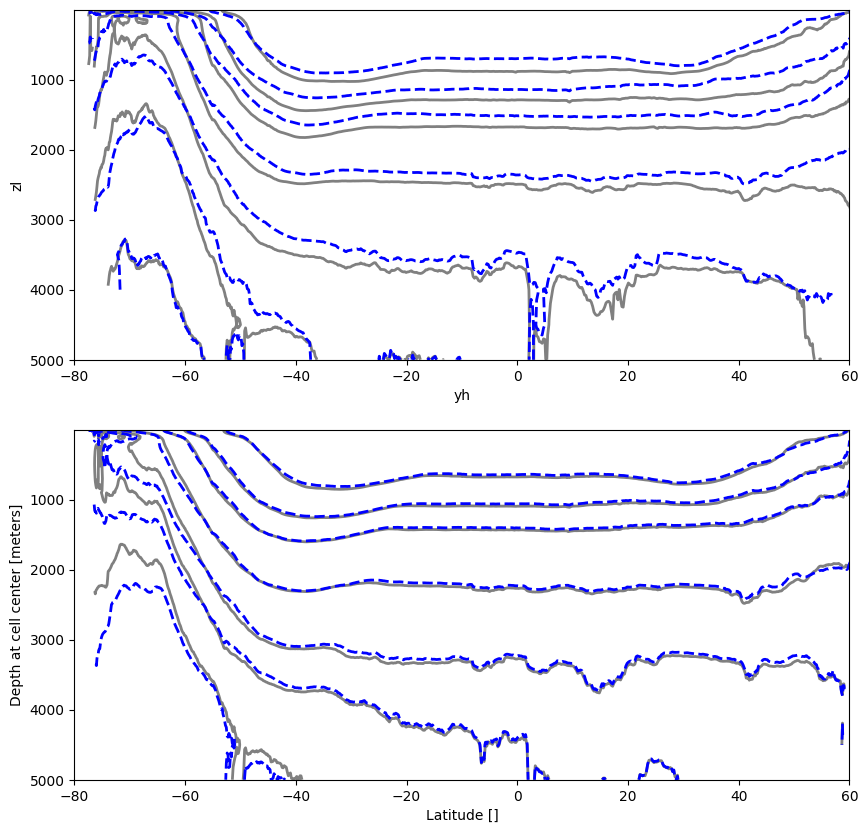

In [233]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

cm25_rho_sigma2.mean('xh').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='gray', linewidths=2)
cm26_rho_sigma2.mean('xh').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='b', linestyles='--', linewidths=2)
plt.xlim([-80, 60])
plt.gca().invert_yaxis()

plt.subplot(2,1,2)

om4_rho_sigma2.mean('xh').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='gray', linewidths=2)
ann_rho_sigma2.mean('xh').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='b', linestyles='--', linewidths=2)
plt.xlim([-80, 60])
plt.gca().invert_yaxis()

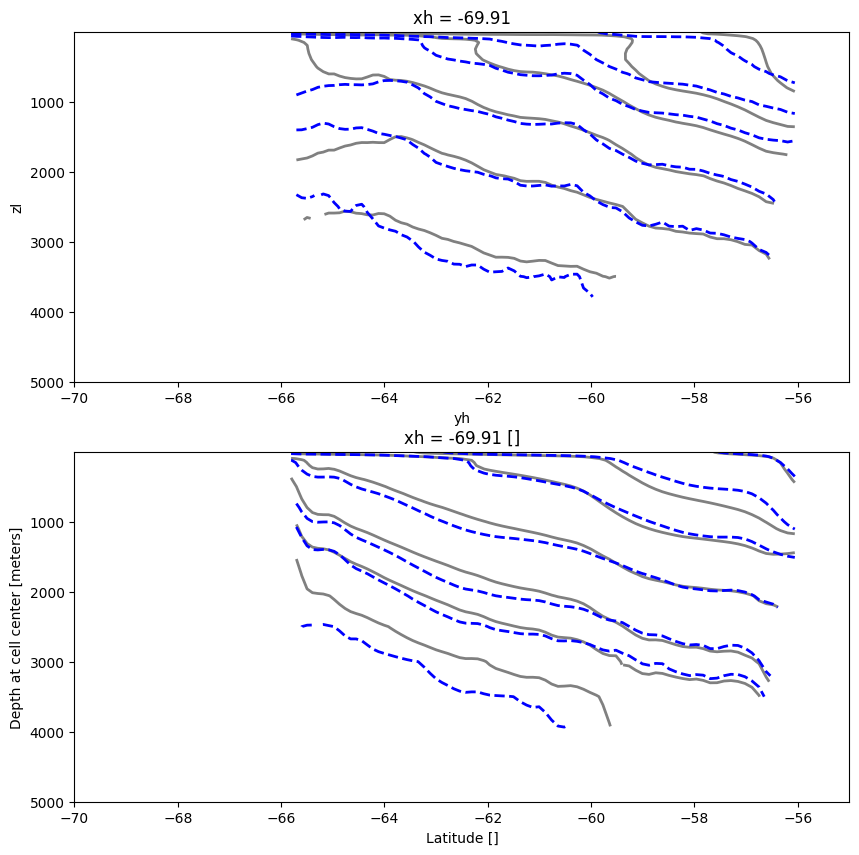

In [238]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)

cm25_rho_sigma2.sel(xh=-70,method='nearest').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='gray', linewidths=2)
cm26_rho_sigma2.sel(xh=-70,method='nearest').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='b', linestyles='--', linewidths=2)
plt.xlim([-70, -55])
plt.gca().invert_yaxis()

plt.subplot(2,1,2)

om4_rho_sigma2.sel(xh=-70,method='nearest').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='gray', linewidths=2)
ann_rho_sigma2.sel(xh=-70,method='nearest').plot.contour(levels=[36,36.4,36.6,36.8,36.9,36.95,37], colors='b', linestyles='--', linewidths=2)
plt.xlim([-70, -55])
plt.gca().invert_yaxis()

# Delta EKE

In [10]:
u_cm25 = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean_bgc_physics_field_u.nc', chunks={'st_ocean':5, 'yu_ocean':100}).u
v_cm25 = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean_bgc_physics_field_v.nc', chunks={'st_ocean':5, 'yu_ocean':100}).v

/ext3/miniconda3/lib/python3.11/site-packages/xarray/coding/times.py:1005: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/ext3/miniconda3/lib/python3.11/site-packages/xarray/coding/times.py:1005: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)


In [31]:
param_cm25_c = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean_bgc_physics_field_u.nc')
param_cm25_t = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean_bgc_physics_field_salt.nc')
zi = param_cm25_c.st_edges_ocean.values
dz = xr.DataArray(np.diff(zi), dims='st_ocean')

In [116]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    u_cm25_mean = u_cm25.mean('time').compute()
    v_cm25_mean = v_cm25.mean('time').compute()
    
    u2_cm25_mean = (u_cm25**2).mean('time').compute()
    v2_cm25_mean = (v_cm25**2).mean('time').compute()

[########################################] | 100% Completed | 86.79 s
[########################################] | 100% Completed | 90.00 s
[########################################] | 100% Completed | 100.10 s
[########################################] | 100% Completed | 90.61 s


In [141]:
mask = xr.where(np.isnan(u_cm25[0][0]),np.nan,1.).compute()
KE_cm25 = (dz * (u2_cm25_mean + v2_cm25_mean) * 0.5).sum('st_ocean') * mask
MKE_cm25 = (dz * (u_cm25_mean**2 + v_cm25_mean**2) * 0.5).sum('st_ocean') * mask
EKE_cm25 = KE_cm25 - MKE_cm25

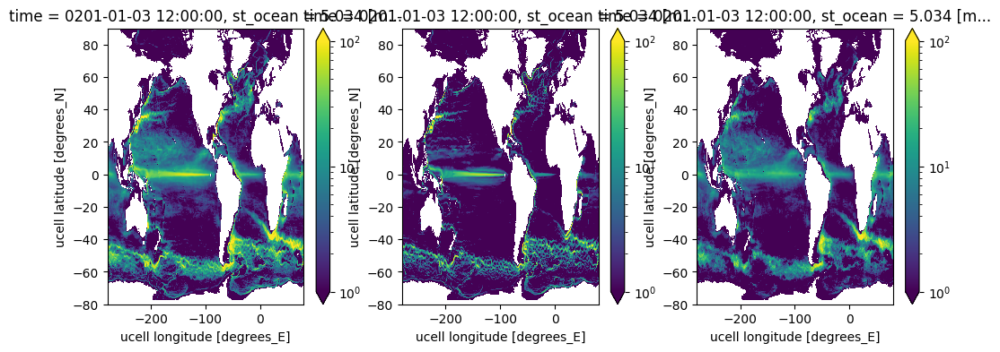

In [147]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
KE_cm25.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))
plt.subplot(1,3,2)
MKE_cm25.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))
plt.subplot(1,3,3)
EKE_cm25.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))

In [148]:
kinetic_energy_cm25 = xr.Dataset()
kinetic_energy_cm25['KE'] = KE_cm25
kinetic_energy_cm25['MKE'] = MKE_cm25
kinetic_energy_cm25['EKE'] = EKE_cm25
kinetic_energy_cm25.to_netcdf('kinetic_energy_cm25.nc')

# Coarsening CM2.6

In [2]:
# Select last year of data
ds_cm26 = xr.open_dataset("gs://cmip6/GFDL_CM2_6/control/ocean_3d", engine='zarr', chunks={}, use_cftime=True).isel(time=slice(-73,None))

In [42]:
param_cm26 = xr.open_dataset('gs://cmip6/GFDL_CM2_6/grid', engine='zarr')

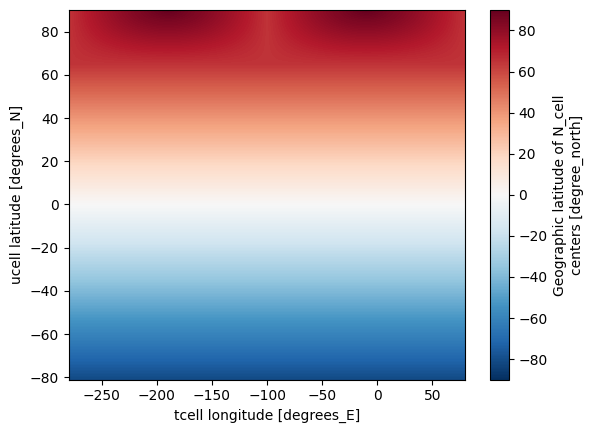

In [4]:
param_cm26.geolat_n.plot()

In [43]:
coords = xr.Dataset()
# corner points
coords['lon'] = param_cm26.geolon_e.interp(yt_ocean=param_cm26.yu_ocean)
coords['lat'] = param_cm26.geolat_n.interp(xt_ocean=param_cm26.xu_ocean)
# Center points (which are corners w.r.t. corner points
lon_b = param_cm26.geolon_e.interp(xu_ocean=param_cm26.xt_ocean)
lat_b = param_cm26.geolat_n.interp(yu_ocean=param_cm26.yt_ocean)
coords['lon_b'] = lon_b.pad({'xt_ocean': (0,1)}, mode='wrap').pad({'yt_ocean': (0,1)}, mode='symmetric')
coords['lat_b'] = lat_b.pad({'xt_ocean': (0,1)}, mode='wrap').pad({'yt_ocean': (0,1)}, mode='symmetric')

coords_out = xr.Dataset()
coords_out['lon'] = param_cm25_c.geolon_c
coords_out['lat'] = param_cm25_c.geolat_c
lon_b = param_cm25_t.geolon_t
lat_b = param_cm25_t.geolat_t
coords_out['lon_b'] = lon_b.pad({'xt_ocean': (0,1)}, mode='wrap').pad({'yt_ocean': (0,1)}, mode='symmetric')
coords_out['lat_b'] = lat_b.pad({'xt_ocean': (0,1)}, mode='wrap').pad({'yt_ocean': (0,1)}, mode='symmetric')

regridder_cm26_cm25 = xe.Regridder(coords.compute(), coords_out.compute(), "conservative", periodic=True, ignore_degenerate=True)

In [246]:
u_load = ds_cm26.u[0][0].compute()

In [247]:
%time uf = regridder_cm26_cm25(u_load).compute()

CPU times: user 2.67 s, sys: 112 ms, total: 2.78 s
Wall time: 3.03 s


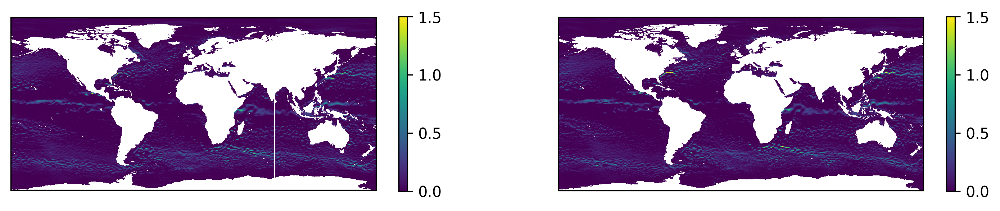

In [259]:
plt.figure(figsize=(12,7), dpi=300)
ax = plt.subplot(1,2,1, projection=ccrs.PlateCarree())
im = ax.pcolormesh(uf.geolon_c, uf.geolat_c, uf, transform=ccrs.PlateCarree(), vmax=1.5, vmin=0)
plt.colorbar(im, shrink=0.3)

ax = plt.subplot(1,2,2, projection=ccrs.PlateCarree())
im = ax.pcolormesh(param_cm26.geolon_e, param_cm26.geolat_e, u_load, transform=ccrs.PlateCarree(), vmax=1.5, vmin=0)
plt.colorbar(im, shrink=0.3)

In [8]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    uc = regridder_cm26_cm25(ds_cm26.u).chunk({'time':-1, 'st_ocean': 1}).compute()
    u_cm26_mean = uc.mean('time')
    u2_cm26_mean = (uc**2).mean('time')
    del uc

    vc = regridder_cm26_cm25(ds_cm26.v).chunk({'time':-1, 'st_ocean': 1}).compute()
    v_cm26_mean = vc.mean('time')
    v2_cm26_mean = (vc**2).mean('time')
    del vc

[########################################] | 100% Completed | 14m 10s
[########################################] | 100% Completed | 13m 22s


In [11]:
mask = xr.where(np.isnan(u_cm25[0][0]),np.nan,1.).compute()
KE_cm26 = (dz * (u2_cm26_mean + v2_cm26_mean) * 0.5).sum('st_ocean') * mask
MKE_cm26 = (dz * (u_cm26_mean**2 + v_cm26_mean**2) * 0.5).sum('st_ocean') * mask
EKE_cm26 = KE_cm26 - MKE_cm26

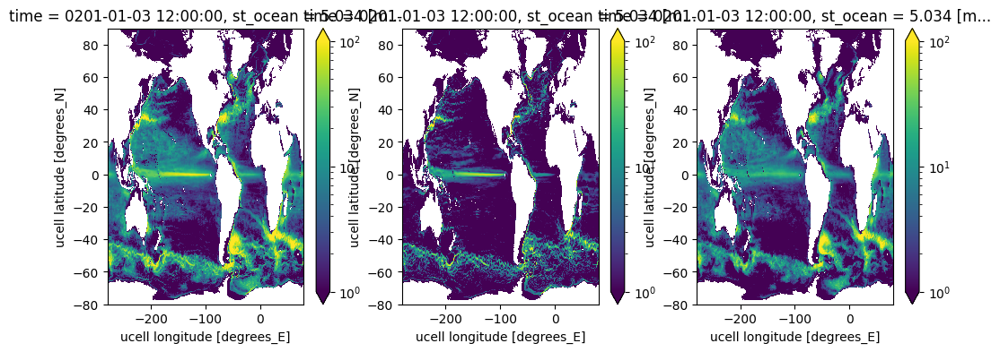

In [15]:
import matplotlib as mpl
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
KE_cm26.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))
plt.subplot(1,3,2)
MKE_cm26.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))
plt.subplot(1,3,3)
EKE_cm26.plot(norm=mpl.colors.LogNorm(vmin=1,vmax=1e+2))

In [16]:
kinetic_energy_cm26 = xr.Dataset()
kinetic_energy_cm26['KE'] = KE_cm26
kinetic_energy_cm26['MKE'] = MKE_cm26
kinetic_energy_cm26['EKE'] = EKE_cm26
kinetic_energy_cm26.to_netcdf('kinetic_energy_cm26.nc')

# Plotting delta KE

In [20]:
kinetic_energy_cm26 = xr.open_dataset('kinetic_energy_cm26.nc')

In [21]:
kinetic_energy_cm25 = xr.open_dataset('kinetic_energy_cm25.nc')

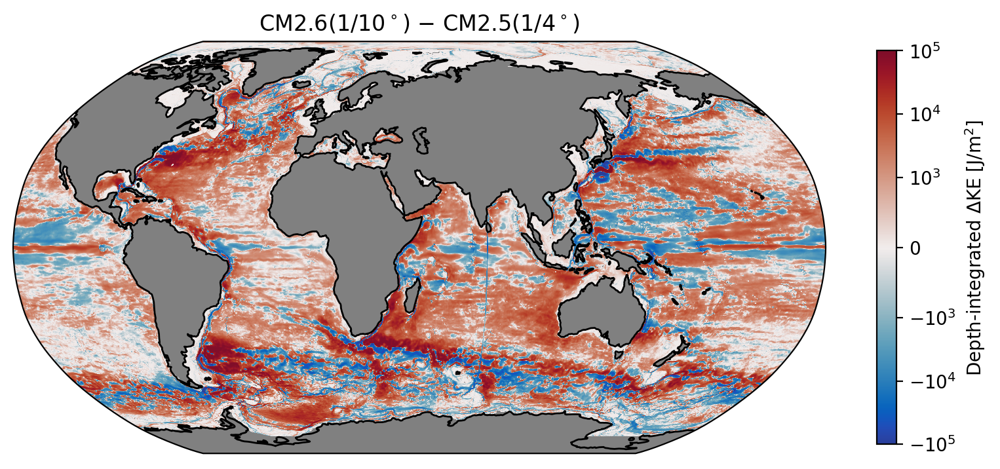

In [25]:
import matplotlib as mpl
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())


fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(kinetic_energy_cm25.geolon_c, kinetic_energy_cm25.geolat_c, rho0*(kinetic_energy_cm26['KE'] - kinetic_energy_cm25['KE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$KE [J/m$^2$]', shrink=0.65)
plt.title('CM2.6($1/10^\circ$) $-$ CM2.5($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dKE_CM_suite.pdf', dpi=200, bbox_inches='tight')

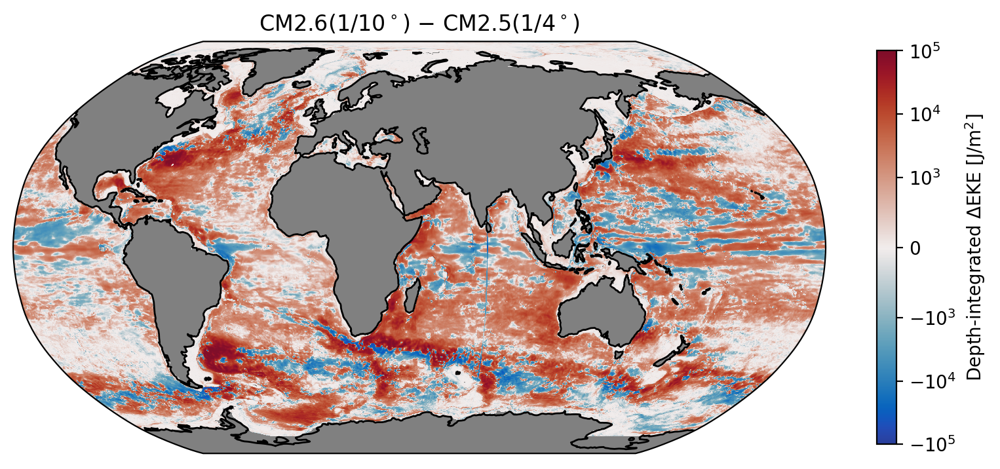

In [26]:
import matplotlib as mpl
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())


fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(kinetic_energy_cm25.geolon_c, kinetic_energy_cm25.geolat_c, rho0*(kinetic_energy_cm26['EKE'] - kinetic_energy_cm25['EKE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$EKE [J/m$^2$]', shrink=0.65)
plt.title('CM2.6($1/10^\circ$) $-$ CM2.5($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dEKE_CM_suite.pdf', dpi=200, bbox_inches='tight')

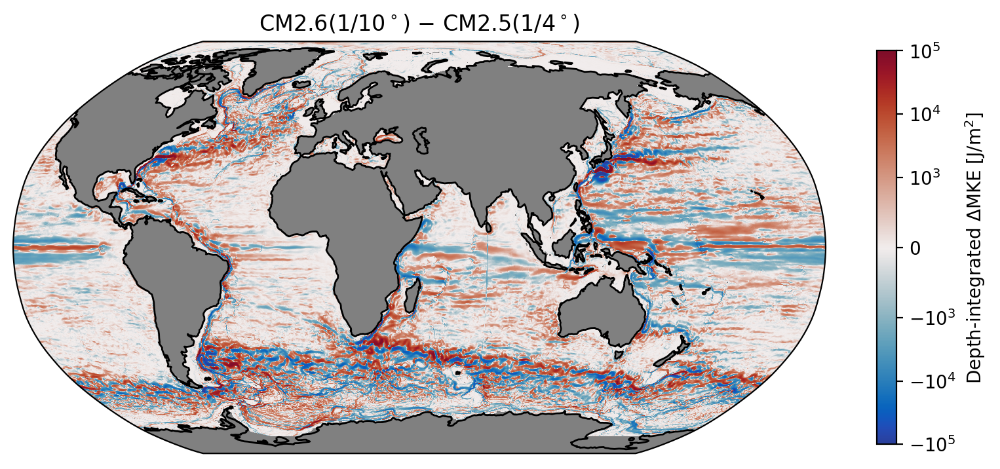

In [24]:
import matplotlib as mpl
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())


fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(kinetic_energy_cm25.geolon_c, kinetic_energy_cm25.geolat_c, rho0*(kinetic_energy_cm26['MKE'] - kinetic_energy_cm25['MKE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$MKE [J/m$^2$]', shrink=0.65)
plt.title('CM2.6($1/10^\circ$) $-$ CM2.5($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dMKE_CM_suite.pdf', dpi=200, bbox_inches='tight')

# Same figures for OM4

In [9]:
param_om4 = ds['unparameterized'].param
mask = xr.where(param_om4.wet > 0.5, 1., np.nan)

# This is saved in m^3/s^2. To convert to Joules/m^2, one should multiply by reference density
rho0 = 1035.
energy_ann = xr.open_dataset('energy_ann.nc') * mask
energy_ctrl = xr.open_dataset('energy_ctrl.nc') * mask

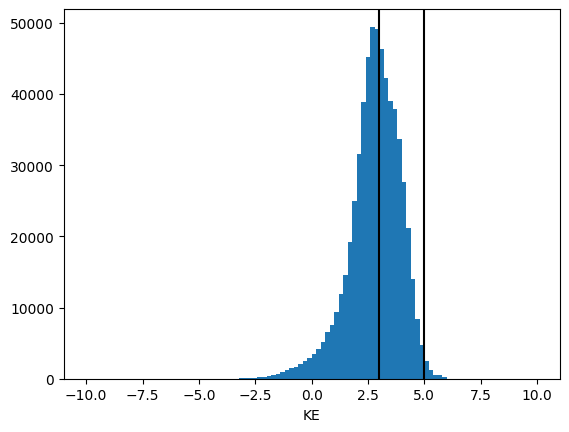

In [15]:
np.log10(rho0*(energy_ann['KE'] - energy_ctrl['KE'])).plot.hist(range=[-10,10], bins=100);
plt.axvline(x=5, color='k')
plt.axvline(x=3, color='k')

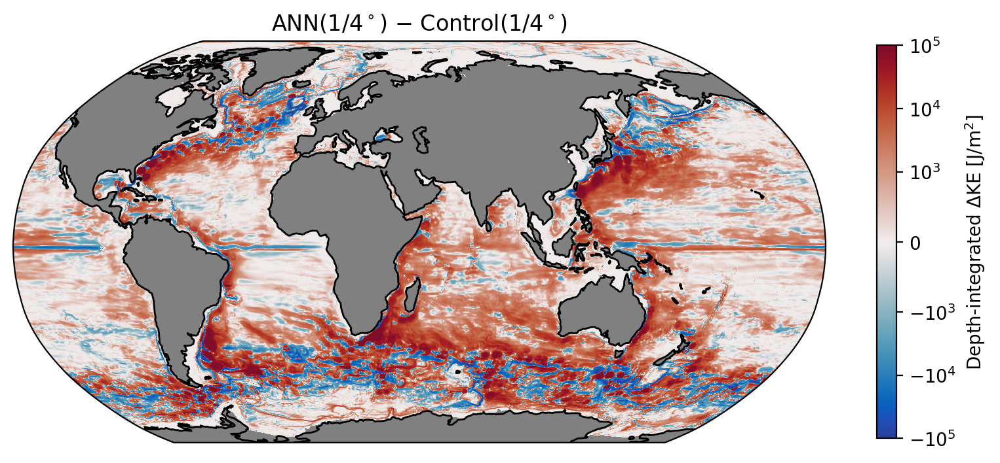

In [17]:
import matplotlib as mpl
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())


fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(param_om4.geolon, param_om4.geolat, rho0*(energy_ann['KE'] - energy_ctrl['KE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$KE [J/m$^2$]', shrink=0.65)
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dKE_OM4_suite.pdf', dpi=200, bbox_inches='tight')

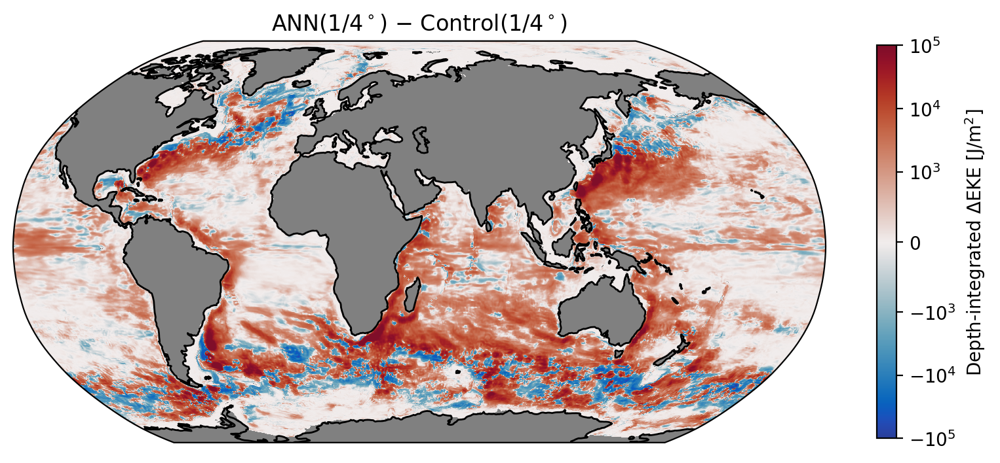

In [18]:
import matplotlib as mpl
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())


fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(param_om4.geolon, param_om4.geolat, rho0*(energy_ann['EKE'] - energy_ctrl['EKE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$EKE [J/m$^2$]', shrink=0.65)
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dEKE_OM4_suite.pdf', dpi=200, bbox_inches='tight')

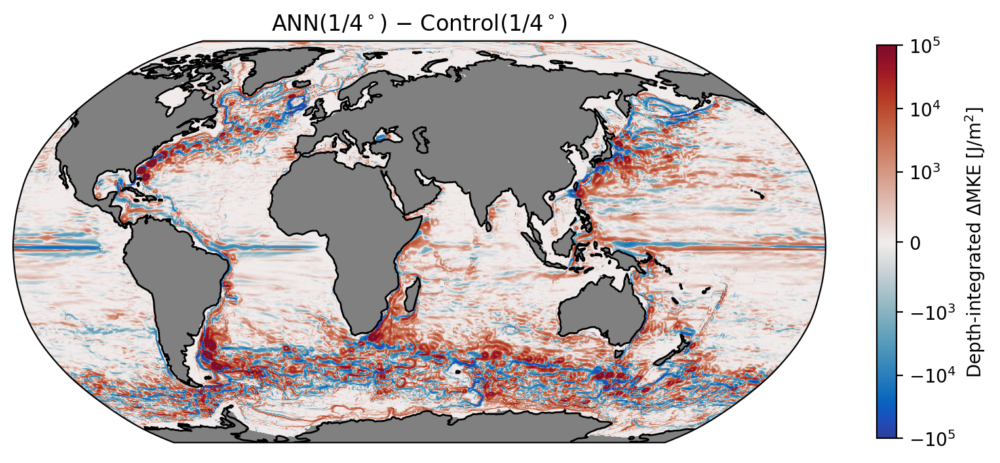

In [19]:
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -1e+5, vmax = 1e+5, linthresh = 1e+3 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())

fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(param_om4.geolon, param_om4.geolat, rho0*(energy_ann['MKE'] - energy_ctrl['MKE']),**params)
plt.colorbar(im, label='Depth-integrated $\Delta$MKE [J/m$^2$]', shrink=0.65)
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
plt.savefig('dMKE_OM4_suite.pdf', dpi=200, bbox_inches='tight')

# Delta APE according to interface data

In [2]:
APE_ctrl = xr.open_dataset('APE_ctrl.nc').__xarray_dataarray_variable__.sum('zi')
APE_ann = xr.open_dataset('APE_ann.nc').__xarray_dataarray_variable__.sum('zi')

In [3]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))
param_om4 = ds['unparameterized'].param

In [4]:
import matplotlib as mpl
rho0 = 1035.

In [5]:
mask_nan = xr.where(param_om4.wet<0.5,np.nan,1)

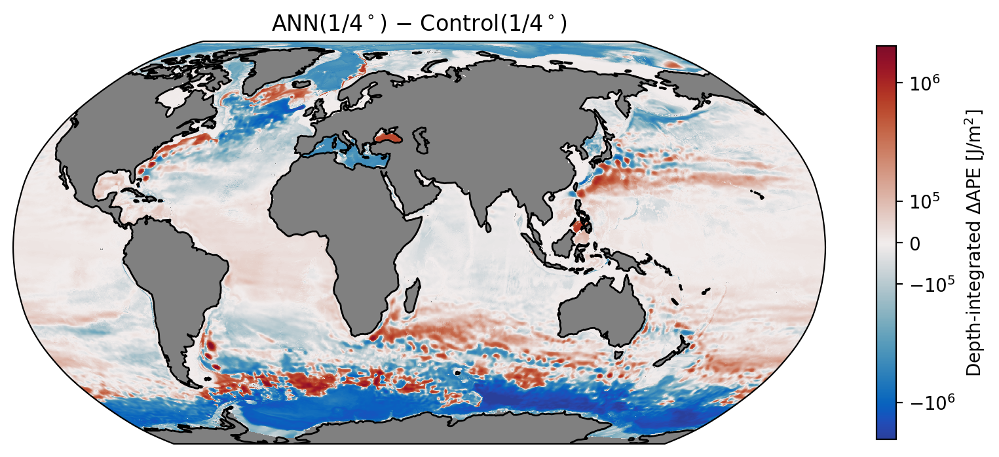

In [103]:
balance_cmap = cmocean.tools.crop_by_percent(cmocean.cm.balance, 20, which='both', N=None)
norm = mpl.colors.SymLogNorm(vmin = -2.5e+6, vmax = 2.5e+6, linthresh = 2.5e+5 )
cmap=cmocean.cm.balance
params = dict(norm=norm,cmap=balance_cmap,rasterized=True, transform=ccrs.PlateCarree())

fig = plt.figure(figsize=(10, 6), dpi=200)
ax = plt.axes(projection=ccrs.Robinson(central_longitude=50))
im = ax.pcolormesh(param_om4.geolon, param_om4.geolat, rho0*(APE_ann-APE_ctrl) * mask_nan,**params)
plt.colorbar(im, label='Depth-integrated $\Delta$APE [J/m$^2$]', shrink=0.65)
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
ax.coastlines()
#gl = ax.gridlines(draw_labels=True, linestyle='--', color='gray')
#ax.axhline(y=-64)
plt.savefig('dAPE_globe_OM4_suite_accurate.pdf', dpi=200, bbox_inches='tight')

In [45]:
%%time
# Coarsen to coarse 1x1 grid
coords = xr.Dataset()
coords['lon'] = param_om4.geolon
coords['lat'] = param_om4.geolat
coords['lon_b'] = param_om4.geolon_c.pad({'yq':(1,0)}, mode='symmetric').pad({'xq':(1,0)}, mode='wrap').drop_vars({'xq','yq'})
coords['lat_b'] = param_om4.geolat_c.pad({'yq':(1,0)}, mode='symmetric').pad({'xq':(1,0)}, mode='wrap').drop_vars({'xq','yq'})

regridder_1x1 = xe.Regridder(coords, xe.util.grid_global(1, 1), "conservative", ignore_degenerate=True, periodic=True, unmapped_to_nan=True)

CPU times: user 36.3 s, sys: 1.35 s, total: 37.6 s
Wall time: 37.9 s


In [84]:
APE_ctrl_1x1 = regridder_1x1(APE_ctrl * mask_nan).compute()
APE_ann_1x1 = regridder_1x1(APE_ann * mask_nan).compute()
lon,lat = APE_ctrl_1x1.lon[0].copy(deep=True),APE_ctrl_1x1.lat[:,0].copy(deep=True)
APE_ctrl_1x1 = APE_ctrl_1x1.drop_vars(['lon','lat'])
APE_ann_1x1 = APE_ann_1x1.drop_vars(['lon','lat'])
APE_ctrl_1x1['x'] = lon
APE_ctrl_1x1['y'] = lat

APE_ann_1x1['x'] = lon
APE_ann_1x1['y'] = lat

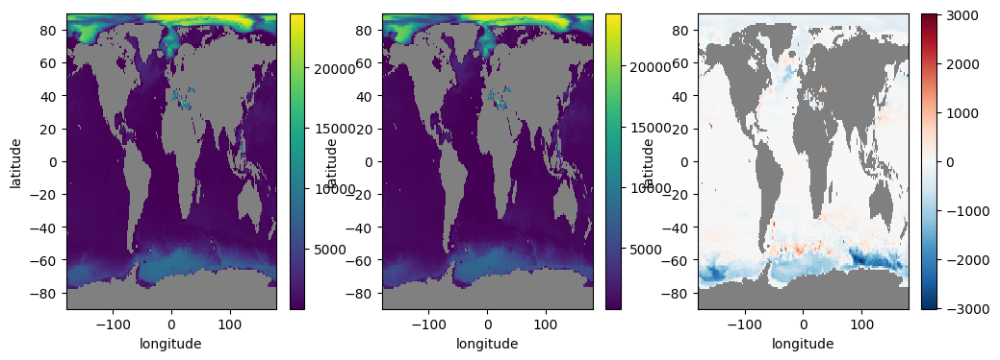

In [85]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
APE_ctrl_1x1.plot()
plt.gca().set_facecolor('gray')

plt.subplot(1,3,2)
APE_ann_1x1.plot()
plt.gca().set_facecolor('gray')

plt.subplot(1,3,3)
(APE_ann_1x1-APE_ctrl_1x1).plot()
plt.gca().set_facecolor('gray')

In [87]:
Rearth = 6378e+3 # Earth radius in m
dx = Rearth * np.deg2rad(1) * np.cos(np.deg2rad(APE_ctrl_1x1.y))

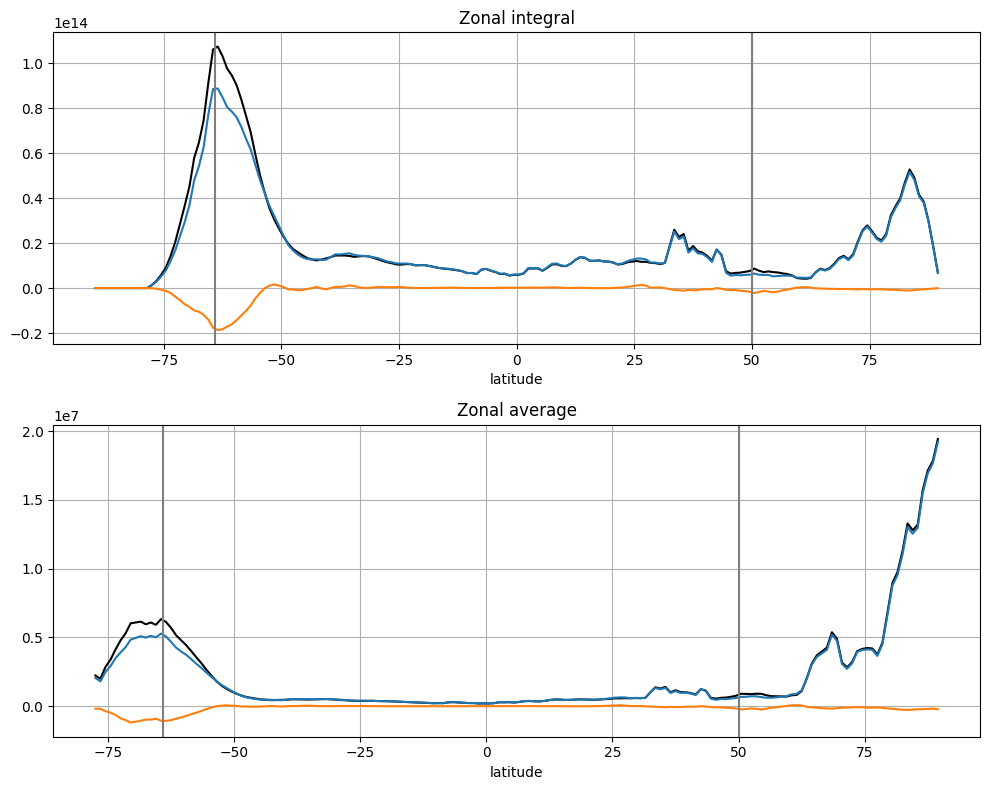

In [100]:
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
(rho0*APE_ctrl_1x1 * dx).sum('x').plot(color='k', x='lat')
(rho0*APE_ann_1x1 * dx).sum('x').plot(color='tab:blue')
(rho0*(APE_ann_1x1-APE_ctrl_1x1) * dx).sum('x').plot(color='tab:orange')
plt.axvline(x=-64, color='tab:gray')
plt.axvline(x=50, color='tab:gray')
plt.title('Zonal integral')
plt.grid()

plt.subplot(2,1,2)
(rho0*APE_ctrl_1x1).mean('x').plot(color='k')
(rho0*APE_ann_1x1).mean('x').plot(color='tab:blue')
(rho0*(APE_ann_1x1-APE_ctrl_1x1)).mean('x').plot(color='tab:orange')
plt.axvline(x=-64, color='tab:gray')
plt.axvline(x=50, color='tab:gray')
plt.title('Zonal average')
plt.grid()

plt.tight_layout()

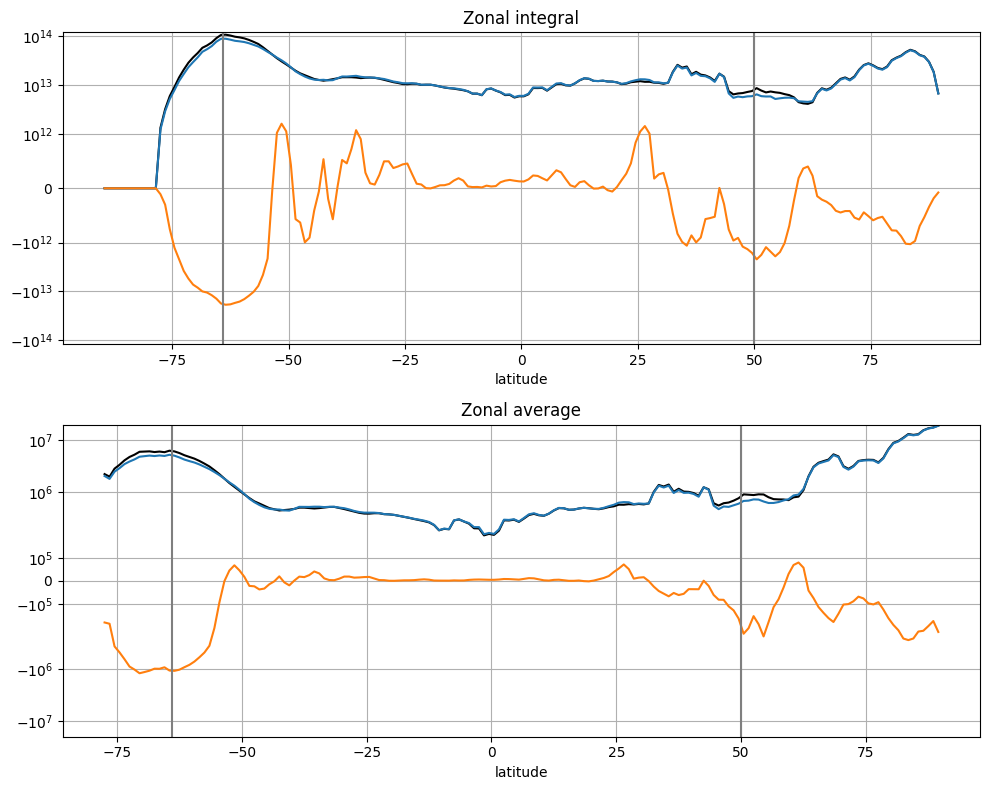

In [102]:
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
(rho0*APE_ctrl_1x1 * dx).sum('x').plot(color='k', x='lat')
(rho0*APE_ann_1x1 * dx).sum('x').plot(color='tab:blue')
(rho0*(APE_ann_1x1-APE_ctrl_1x1) * dx).sum('x').plot(color='tab:orange')
plt.axvline(x=-64, color='tab:gray')
plt.axvline(x=50, color='tab:gray')
plt.title('Zonal integral')
plt.grid()
plt.gca().set_yscale('symlog', linthresh=1e+12)
plt.gca().set_ylim([-1.2e+14, 1.2e+14])


plt.subplot(2,1,2)
(rho0*APE_ctrl_1x1).mean('x').plot(color='k')
(rho0*APE_ann_1x1).mean('x').plot(color='tab:blue')
(rho0*(APE_ann_1x1-APE_ctrl_1x1)).mean('x').plot(color='tab:orange')
plt.axvline(x=-64, color='tab:gray')
plt.axvline(x=50, color='tab:gray')
plt.title('Zonal average')
plt.grid()
plt.gca().set_yscale('symlog', linthresh=2.5e+5)
plt.gca().set_ylim([-2e+7, 2e+7])

plt.tight_layout()

# Change in barotropic streamfunction in CM26

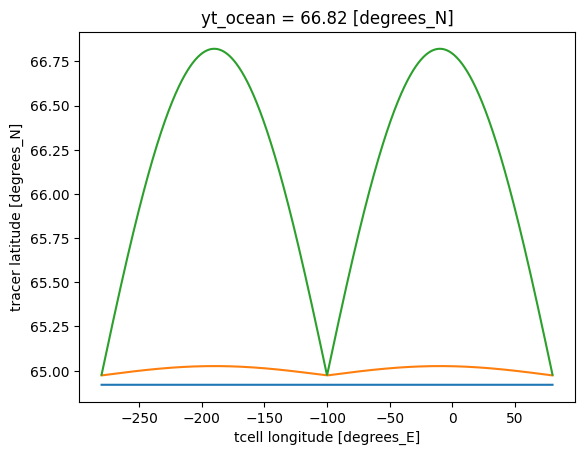

In [110]:
# Tripolar grid starts only after the 65N. So we can use grid spacing of a sphere in most parts of the domain
param_cm25_t.geolat_t.isel(yt_ocean=832).plot()
param_cm25_t.geolat_t.isel(yt_ocean=833).plot()
param_cm25_t.geolat_t.isel(yt_ocean=850).plot()

(-0.01, 0.01)

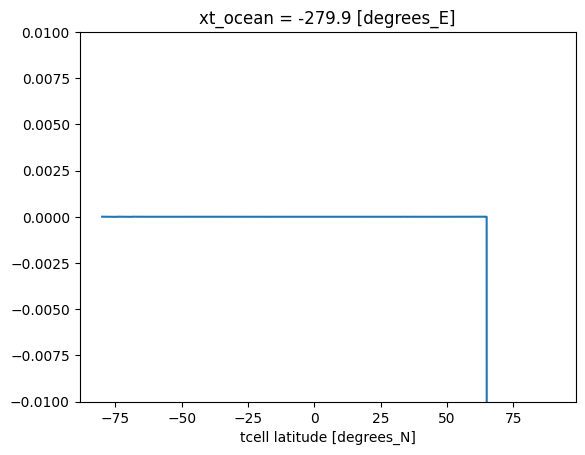

In [117]:
# Also, yt_ocean is an actual coordinate
(param_cm25_t.geolat_t[:,0] - param_cm25_t.yt_ocean).plot()
plt.ylim([-0.01,0.01])

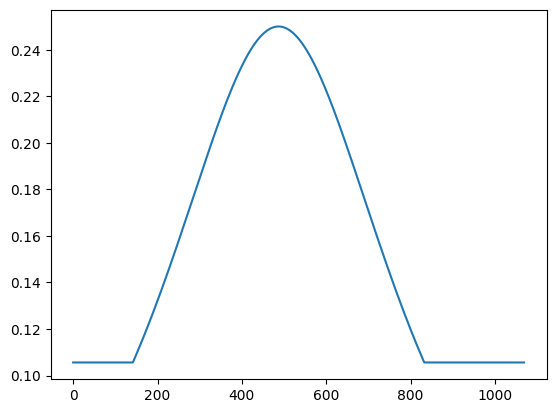

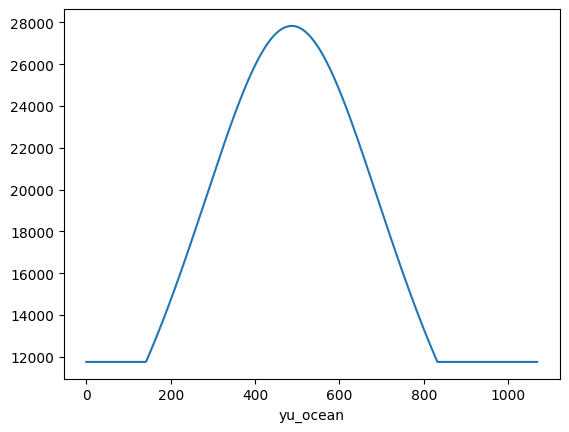

In [51]:
# Finding Latitudal grid spacing by differencing center values of latitudes
dlat = param_cm25_t.yt_ocean.values[1:] - param_cm25_t.yt_ocean.values[:-1]
#len(dlat) = 1069; These points correspond to all center points apart the last one; We pad it by continuity
dlat = np.pad(dlat, (0,1), mode='constant', constant_values = dlat[-1])
plt.plot(dlat)
Rearth = 6.378E+06 #m
grad_to_rad = np.pi / 180.
dy = xr.DataArray(Rearth * dlat * grad_to_rad, dims = 'yu_ocean')
plt.figure()
dy.plot()

In [52]:
u = xr.open_mfdataset('/scratch/zanna/CM2.5_data/02010101.ocean.nc').u.mean('time').compute()
mask_cm25 = xr.where(np.isnan(u[0]),np.nan,1)
psi_global_cm25 = - ((u * dz * dy).sum('st_ocean').cumsum('yu_ocean')).compute() / 1e+6
# We prefer to reference barotropic streamfunction to the Southern ocean
#psi_global_cm25 = psi_global_cm25 - psi_global_cm25.sel(xu_ocean=-80,yu_ocean=40,method='nearest') 
psi_global_cm25 = psi_global_cm25 #* mask_cm25

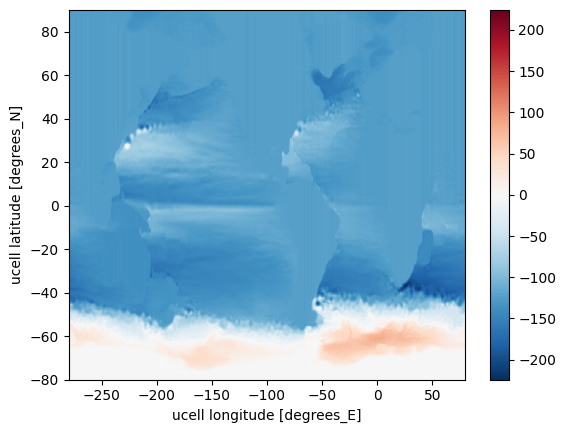

In [53]:
psi_global_cm25.plot()

In [54]:
psi_global_cm25.to_netcdf('psi_global_cm25.nc')

# Barotropic streamfunction CM2.6

In [40]:
u = xr.open_dataset("gs://cmip6/GFDL_CM2_6/control/ocean", engine='zarr', chunks={}, use_cftime=True).u[-12:].mean('time').compute() # 12 month

In [41]:
param_cm26 = xr.open_dataset('gs://cmip6/GFDL_CM2_6/grid', engine='zarr')

In [44]:
mask_cm26 = xr.where(np.isnan(u[0]),np.nan,1)
psi_global_cm26 = - ((u * dz * param_cm26.dyu).sum('st_ocean').cumsum('yu_ocean')).compute() / 1e+6
#We reference streamfunction to the Southern Ocean
#psi_global_cm26 = psi_global_cm26 - psi_global_cm26.sel(xu_ocean=-80,yu_ocean=40,method='nearest')
psi_global_cm26 = psi_global_cm26
psi_global_cm26 = regridder_cm26_cm25(psi_global_cm26)

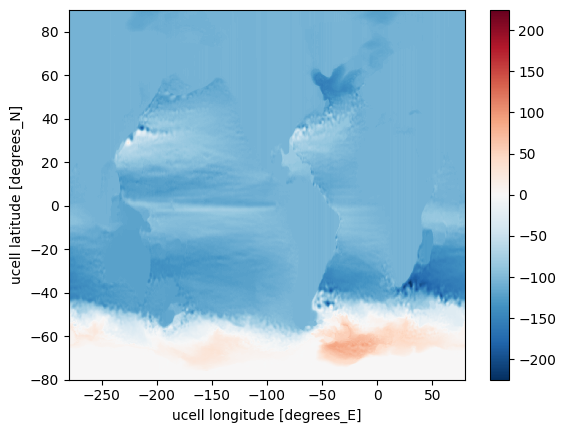

In [48]:
psi_global_cm26.plot()

In [50]:
psi_global_cm26.to_netcdf('psi_global_cm26.nc')

# Barotropic stremfunction difference

In [55]:
psi_global_cm26 = xr.open_dataset('psi_global_cm26.nc').__xarray_dataarray_variable__
psi_global_cm25 = xr.open_dataset('psi_global_cm25.nc').__xarray_dataarray_variable__

In [172]:
def reference_Drake(psi):
    '''
    Reference Stream function to Drake Passage
    '''
    return psi - psi.sel(xu_ocean=-70,method='nearest').sel(yu_ocean=-55,method='nearest')

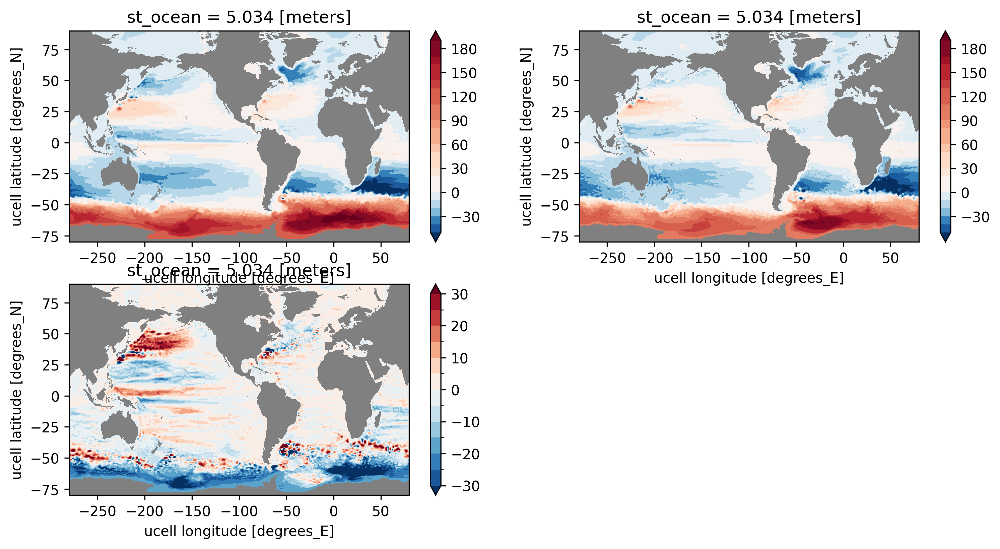

In [75]:
import matplotlib as mpl
plt.figure(figsize=(12,6), dpi=300)
plt.subplot(2,2,1)
norm = mpl.colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=190)  # White at zero
(reference_Drake(psi_global_cm25)*mask_cm25).plot.contourf(levels=np.arange(-50,200,10), norm=norm)
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
norm = mpl.colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=190)  # White at zero
(reference_Drake(psi_global_cm26)*mask_cm25).plot.contourf(levels=np.arange(-50,200,10), norm=norm)
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
((reference_Drake(psi_global_cm26) - reference_Drake(psi_global_cm25))*mask_cm25).plot.contourf(levels=np.arange(-30,35,5))
plt.gca().set_facecolor('gray')

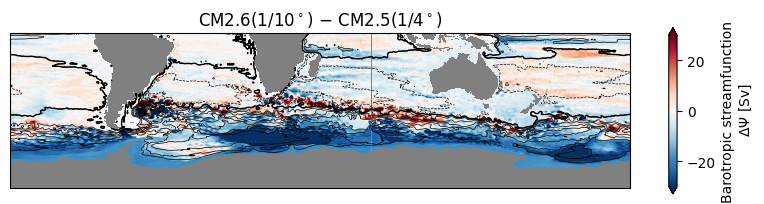

In [173]:
import matplotlib as mpl
params = dict(vmin=-30, cmap=mpl.cm.RdBu_r,rasterized=True, transform=ccrs.PlateCarree(), cbar_kwargs=dict(label='Barotropic streamfunction\n $\Delta \Psi$ [Sv]', shrink=0.36, extend='both'))

fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=50))
((reference_Drake(psi_global_cm26) - reference_Drake(psi_global_cm25))*mask_cm25).plot.pcolormesh(ax=ax,**params)
(reference_Drake(psi_global_cm25)*mask_cm25).plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=np.arange(-200,200,20), colors='k', linewidths=0.5)
(reference_Drake(psi_global_cm25)*mask_cm25).plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0], colors='k', linewidths=1)
ax.set_extent([-180,180,-90,0],ccrs.PlateCarree())
plt.title('CM2.6($1/10^\circ$) $-$ CM2.5($1/4^\circ$)')
plt.gca().set_facecolor('gray')
#ax.coastlines()
plt.savefig('dPsi_CM_suite_SO.pdf', dpi=200, bbox_inches='tight')

Text(0.5, 1.0, 'ACC weakening response is positive \n(referenced to SO)')

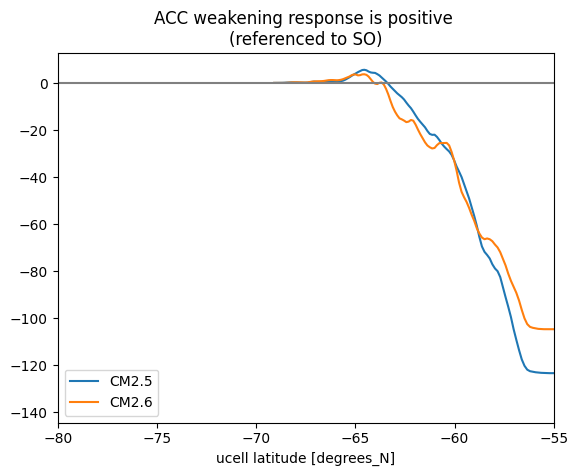

In [77]:
(psi_global_cm25*mask_cm25).sel(xu_ocean=-70, method='nearest').plot(label='CM2.5')
(psi_global_cm26*mask_cm25).sel(xu_ocean=-70, method='nearest').plot(label='CM2.6')
plt.axhline(y=0,color='gray')
plt.xlim([-80,-55])
plt.legend()
plt.title('ACC weakening response is positive \n(referenced to SO)')

Text(0.5, 1.0, 'ACC weakening response is negative \n(referenced to South America)')

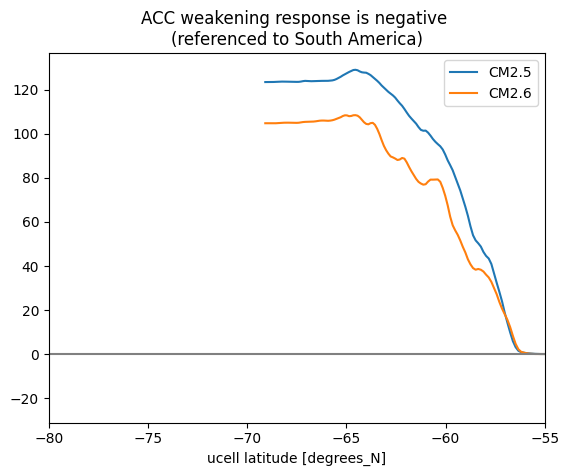

In [78]:
reference_Drake(psi_global_cm25*mask_cm25).sel(xu_ocean=-70, method='nearest').plot(label='CM2.5')
reference_Drake(psi_global_cm26*mask_cm25).sel(xu_ocean=-70, method='nearest').plot(label='CM2.6')
plt.axhline(y=0,color='gray')
plt.xlim([-80,-55])
plt.legend()
plt.title('ACC weakening response is negative \n(referenced to South America)')

# Check OM4

In [165]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

In [4]:
mask_nan = xr.where(ds['unparameterized'].param.wet_c>0.5,1.,np.nan)

<xarray.DataArray 'wet_c' ()> Size: 8B
array(nan)
Coordinates:
    xq       float64 8B -70.01
    yq       float64 8B -55.0

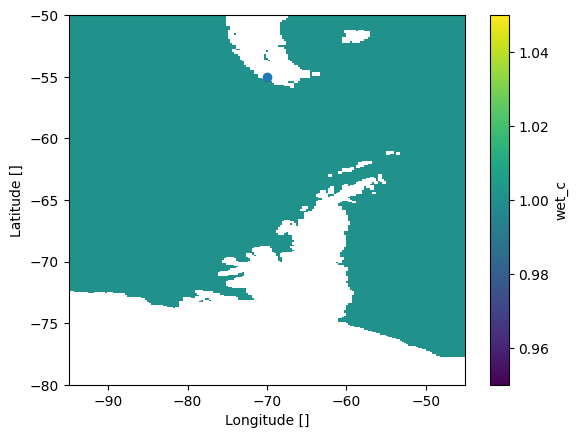

In [13]:
# Suggested reference point for Barotropic Streamfunction
mask_nan.plot()
plt.plot(-70,-55,marker='o')
plt.xlim([-95,-45])
plt.ylim([-80,-50])
mask_nan.sel(xq=-70,method='nearest').sel(yq=-55,method='nearest')

In [162]:
def reference_Drake(psi):
    '''
    Reference Stream function to Drake Passage
    '''
    return psi - psi.sel(xq=-70,method='nearest').sel(yq=-55,method='nearest')

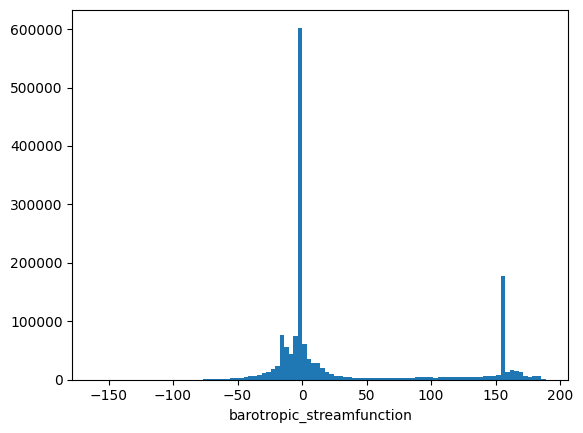

In [19]:
reference_Drake(ds['unparameterized'].barotropic_streamfunction).plot.hist(bins=100);

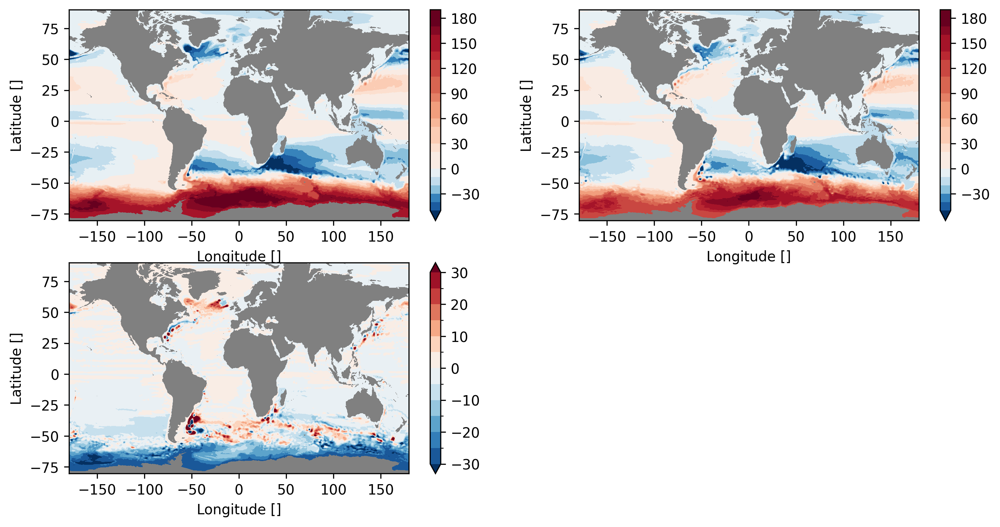

In [72]:
import matplotlib as mpl
plt.figure(figsize=(12,6), dpi=300)
plt.subplot(2,2,1)
norm = mpl.colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=190)  # White at zero
(reference_Drake(ds['unparameterized'].barotropic_streamfunction)*mask_nan).plot.contourf(levels=np.arange(-50,200,10), norm=norm)
plt.gca().set_facecolor('gray')

plt.subplot(2,2,2)
norm = mpl.colors.TwoSlopeNorm(vmin=-50, vcenter=0, vmax=190)  # White at zero
(reference_Drake(ds['ANN'].barotropic_streamfunction)*mask_nan).plot.contourf(levels=np.arange(-50,200,10), norm=norm)
plt.gca().set_facecolor('gray')

plt.subplot(2,2,3)
((reference_Drake(ds['ANN'].barotropic_streamfunction) - reference_Drake(ds['unparameterized'].barotropic_streamfunction))*mask_nan).plot.contourf(levels=np.arange(-30,35,5))
plt.gca().set_facecolor('gray')

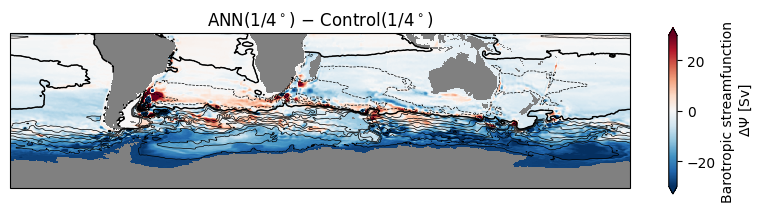

In [170]:
import matplotlib as mpl
params = dict(vmin=-30, cmap=mpl.cm.RdBu_r,rasterized=True, transform=ccrs.PlateCarree(), cbar_kwargs=dict(label='Barotropic streamfunction\n $\Delta \Psi$ [Sv]', shrink=0.36, extend='both'))

fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=50))
((reference_Drake(ds['ANN'].barotropic_streamfunction) - reference_Drake(ds['unparameterized'].barotropic_streamfunction))*mask_nan).plot.pcolormesh(ax=ax,**params)
(reference_Drake(ds['unparameterized'].barotropic_streamfunction)*mask_nan).plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=np.arange(-200,200,20), colors='k', linewidths=0.5)
(reference_Drake(ds['unparameterized'].barotropic_streamfunction)*mask_nan).plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0], colors='k', linewidths=1)
ax.set_extent([-180,180,-90,0],ccrs.PlateCarree())
plt.title('ANN($1/4^\circ$) $-$ Control($1/4^\circ$)')
plt.gca().set_facecolor('gray')
#ax.coastlines()
plt.savefig('dPsi_OM4_SO.pdf', dpi=200, bbox_inches='tight')

Text(0.5, 1.0, 'ACC weakening response is positive \n(referenced to SO)')

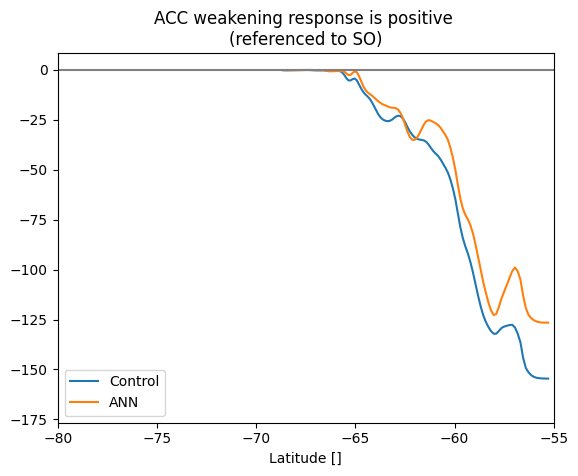

In [26]:
(ds['unparameterized'].barotropic_streamfunction*mask_nan).sel(xq=-70, method='nearest').plot(label='Control')
(ds['ANN'].barotropic_streamfunction*mask_nan).sel(xq=-70, method='nearest').plot(label='ANN')
plt.axhline(y=0,color='gray')
plt.xlim([-80,-55])
plt.legend()
plt.title('ACC weakening response is positive \n(referenced to SO)')

Text(0.5, 1.0, 'ACC weakening response is negative \n(referenced to Drake)')

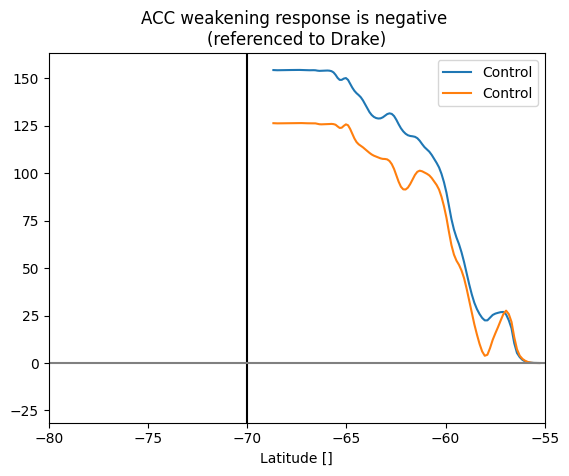

In [27]:
(reference_Drake(ds['unparameterized'].barotropic_streamfunction)*mask_nan).sel(xq=-70, method='nearest').plot(label='Control')
(reference_Drake(ds['ANN'].barotropic_streamfunction)*mask_nan).sel(xq=-70, method='nearest').plot(label='Control')
plt.axvline(x=-50, color='k')
plt.axvline(x=-70, color='k')
plt.axhline(y=0,color='gray')
plt.legend()
plt.xlim([-80,-55])
plt.title('ACC weakening response is negative \n(referenced to Drake)')

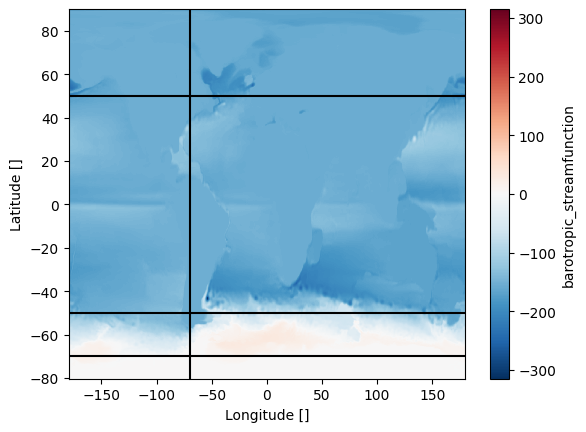

In [327]:
# Because South and North America is a single peace of land, referencing to South or North America are effecticely the same
ds['unparameterized'].barotropic_streamfunction.plot()
plt.axvline(x=-70, color='k')
plt.axhline(y=-50, color='k')
plt.axhline(y=-70, color='k')
plt.axhline(y=50, color='k')

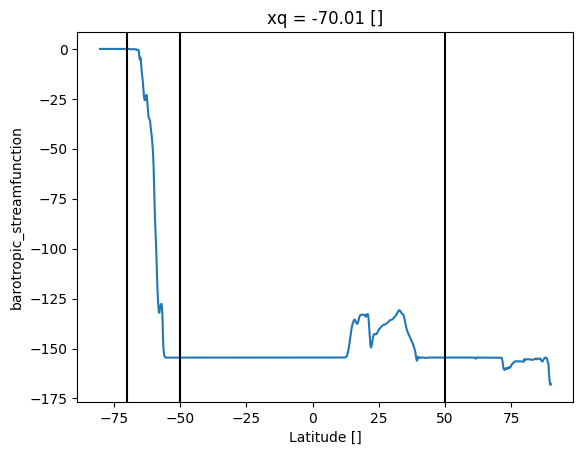

In [328]:
# Se we can simply reference streamfunction to South America and easily compute the response in ANN which should be about 20 Sv
ds['unparameterized'].barotropic_streamfunction.sel(xq=-70,method='nearest').plot()
plt.axvline(x=-50, color='k')
plt.axvline(x=-70, color='k')
plt.axvline(x=50, color='k')

In [326]:
# Difference between South and North America lands
(ds['unparameterized'].barotropic_streamfunction.sel(xq=-70,method='nearest').sel(yq=50,method='nearest') - ds['unparameterized'].barotropic_streamfunction.sel(xq=-70,method='nearest').sel(yq=-50,method='nearest')).values

array(0.04095459, dtype=float32)